In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import spacy
nlp = spacy.load("en_core_web_lg")

from tqdm import tqdm
tqdm.pandas()   

from src import config
from src.datasets import TextConcatFactCheck, TextConcatPosts
from src.utils import cleaning_spacy, cleaning_spacy_batch

tasks_path = config.TASKS_PATH
posts_path = config.POSTS_PATH
fact_checks_path = config.FACT_CHECKS_PATH
gs_path = config.GS_PATH
lang = 'tha'
task_name = "monolingual"

print("Loading Fact Checks...")
fc = TextConcatFactCheck(fact_checks_path, tasks_path=tasks_path, task_name=task_name, lang=lang)
print("Loading Fact Checks (English + Clean)...")
fc_eng = TextConcatFactCheck(fact_checks_path, tasks_path=tasks_path, task_name=task_name, lang=lang, version="english", cleaning_function=lambda x: cleaning_spacy_batch(x, nlp))

print("Loading Posts...")
posts = TextConcatPosts(posts_path, tasks_path=tasks_path, task_name=task_name, lang=lang, gs_path=gs_path)
print("Loading Posts (English + Clean)...")
posts_eng = TextConcatPosts(posts_path, tasks_path=tasks_path, task_name=task_name, lang=lang, gs_path=gs_path, version="english", cleaning_function=lambda x: cleaning_spacy_batch(x, nlp))

/gpfs/projects/bsc14/scratch/.conda/factcheck/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Loading Fact Checks...
Loading Fact Checks (English + Clean)...


100%|██████████| 382/382 [00:00<00:00, 401.16it/s]


Loading Posts...
Loading Posts (English + Clean)...


100%|██████████| 465/465 [00:04<00:00, 101.94it/s]


In [2]:
df_train_posts = posts.df_train
df_train_posts_clean = posts_eng.df_train

df_dev_posts = posts.df_dev
df_dev_posts_clean = posts_eng.df_dev

df_fc = fc.df
df_fc_clean = fc_eng.df_clean

In [ ]:
from src.models import EmbeddingModel, CrossencoderModel

teacher_model_path = '/home/bsc/bsc830651/.cache/huggingface/hub/models--intfloat--multilingual-e5-large/snapshots/ab10c1a7f42e74530fe7ae5be82e6d4f11a719eb'
teacher_model = EmbeddingModel(model_name=teacher_model_path, df_fc=df_fc, batch_size=512)

Batches: 100%|██████████| 1/1 [00:01<00:00,  1.71s/it]


In [ ]:
idx_dense, sim_dense = teacher_model.predict(df_train_posts["full_text"].values, scores=True, limit_k=False)

Batches:   0%|          | 0/2 [00:00<?, ?it/s]

Batches: 100%|██████████| 2/2 [00:04<00:00,  2.11s/it]


In [9]:
from src.models import BM25Model, BaseModel
from rank_bm25 import BM25Okapi
from bm25_pt import BM25

import numpy as np
from tqdm import tqdm
from concurrent.futures import ThreadPoolExecutor

class BM25ModelPar(BaseModel):
    def __init__(self, df_fc, model_name="BM25Okapi", device="cuda", show_progress_bar=True, batch_size=512, k=10, **kwargs):
        super().__init__(device, show_progress_bar, batch_size, k)

        if model_name == "BM25Okapi":
            self.model = BM25()
            self.model.index(df_fc["full_text"].values.tolist())


        # self.emb_fc = self.model(df_fc["full_text"].str.split().values)
        self.pos_to_idx = {pos: idx for pos, idx in enumerate(df_fc.index)}

    def _compute_similarity_batch(self, texts_batch):
        return np.array([self.emb_fc.get_scores(text.split()) for text in texts_batch])

    def predict(self, texts, scores=False, limit_k=True):
        # # Split texts into batches
        # batches = [texts[i:i + self.batch_size] for i in range(0, len(texts), self.batch_size)]
        
        # # Use ThreadPoolExecutor to process batches in parallel
        # with ThreadPoolExecutor() as executor:
        #     sim_batches = list(tqdm(executor.map(self._compute_similarity_batch, batches), total=len(batches), desc="Processing texts in batches"))
        
        print("Splitting texts...")
        # splitted_texts = [text.split() for text in texts]
        print("Computing similarity...")
        sim = self.model.score_batch(texts.tolist())
        print("Sorting...")
        # Flatten the list of batch results into a single array
        # sim = np.vstack(sim_batches)
        
        idx_sim = np.argsort(-sim, axis=1)

        # Apply the function element-wise to the array
        vectorized_map = np.vectorize(lambda x: self.pos_to_idx.get(x, None))

        if scores:
            if limit_k:
                return vectorized_map(idx_sim)[:, :self.k], np.sort(sim, axis=1)[:, ::-1][:, :self.k]
            else:
                return vectorized_map(idx_sim), sim
        else:
            return vectorized_map(idx_sim)


bm25_model = BM25ModelPar(df_fc=df_fc_clean, batch_size=1024, k=100000, normalize_embeddings=True)

In [10]:
idxs_bm25, sim_bm25 = bm25_model.predict(df_train_posts_clean["full_text"].values, scores=True, limit_k=False)

Token indices sequence length is longer than the specified maximum sequence length for this model (920 > 512). Running this sequence through the model will result in indexing errors


Splitting texts...
Computing similarity...
Sorting...


In [3]:
from src.models import BM25Model

In [4]:
bm25_model_norm = BM25Model(df_fc=df_fc_clean, batch_size=512, k=100000, normalize_embeddings=True, model_name="BM25-PT")
idxs_bm25_norm, sim_bm25_norm = bm25_model_norm.predict(df_train_posts_clean["full_text"].values, scores=True, limit_k=False)

512it [00:00, 2862.06it/s]             ?, ?it/s]/gpfs/projects/bsc14/scratch/.conda/factcheck/lib/python3.10/site-packages/bm25_pt/bm25.py:28: UserWarning: Sparse CSR tensor support is in beta state. If you miss a functionality in the sparse tensor support, please submit a feature request to https://github.com/pytorch/pytorch/issues. (Triggered internally at ../aten/src/ATen/SparseCsrTensorImpl.cpp:53.)
  return torch.sparse_csr_tensor(idx_ptr, idxs, vals, size=csr.shape)
Token indices sequence length is longer than the specified maximum sequence length for this model (920 > 512). Running this sequence through the model will result in indexing errors


In [15]:
bm25_model_norm.fit(df_fc_clean["full_text"].values)

AttributeError: 'BM25Model' object has no attribute 'fit'

In [13]:
df_bm25_dev = df_dev_posts_clean.copy()
df_bm25_dev["preds"] = bm25_model_norm.predict(df_bm25_dev["full_text"].values).tolist()

In [14]:
print(bm25_model_norm.evaluate(df_bm25_dev, lang=lang, task_name=task_name))

{'monolingual': {'tha': {1: np.float64(0.7659574468085106), 3: np.float64(0.8297872340425532), 5: np.float64(0.8723404255319149), 10: np.float64(0.9148936170212766)}}}


In [6]:
idxs_bm25_norm

array([[193412, 193380, 193551, ..., 118687,   8857, 193609],
       [193387, 193607, 193543, ..., 193608,   8857,   8144],
       [193453, 193432, 193369, ..., 193608,  88461,  33945],
       ...,
       [193303, 193366, 193370, ...,  33945,   8145,   8144],
       [193593, 193362, 193604, ...,  20642,   8857,   8145],
       [193556,  10587, 193535, ...,  20642,   8857,   8145]])

In [6]:
idxs_bm25_norm

array([[193412, 193414, 193567, ..., 193512, 193284, 193554],
       [193387, 193489, 193561, ..., 193338, 193273, 193554],
       [193453, 193447, 193323, ..., 193589, 193284, 193388],
       ...,
       [193303, 193366, 193370, ..., 193500, 193548, 193284],
       [193362, 193593, 193448, ..., 193326, 193284, 193388],
       [193556, 193300, 193358, ..., 193326, 193284, 193559]])

In [37]:
idxs_bm25_norm

array([[ 40901,  82598, 102389, ..., 156688, 156770,     15],
       [ 80411,  32190,  79459, ..., 156688, 156770,     15],
       [138007, 136895,  44370, ..., 156688, 156770,     15],
       ...,
       [ 81157,  81544, 139035, ..., 156688, 156770,     15],
       [ 44363,  81541,  82817, ..., 156688, 156770,     15],
       [ 79279,  85265,  33597, ..., 156688, 156770,     15]])

In [36]:
(idxs_bm25_norm == idxs_bm25).all()

np.False_

In [31]:
df_bm25_dev = df_dev_posts_clean.copy()
df_bm25_dev["preds"] = bm25_model.predict(df_dev_posts_clean["full_text"].values).tolist()

df_dense_dev = df_dev_posts.copy()
df_dense_dev["preds"] = teacher_model.predict(df_dev_posts["full_text"].values).tolist()

print(bm25_model.evaluate(df_bm25_dev, lang=lang, task_name=task_name))
print(teacher_model.evaluate(df_dense_dev, lang=lang, task_name=task_name))

Batches: 100%|██████████| 1/1 [00:00<00:00,  1.94it/s]

{'monolingual': {'deu': {1: np.float64(0.39344262295081966), 3: np.float64(0.5573770491803278), 5: np.float64(0.6229508196721312), 10: np.float64(0.6557377049180327)}}}
{'monolingual': {'deu': {1: np.float64(0.36065573770491804), 3: np.float64(0.6229508196721312), 5: np.float64(0.6557377049180327), 10: np.float64(0.7049180327868853)}}}


# 

In [16]:
vectorized_map = np.vectorize(lambda x: bm25_model.pos_to_idx.get(x, None))

# sim_bm25_norm = sim_bm25 / sim_bm25.sum(axis=1)[:, None]
# sim_dense_norm = sim_dense / sim_dense.sum(axis=1)[:, None]

sim_bm25_norm = (sim_bm25 - sim_bm25.min(axis=1, keepdims=True)) / (sim_bm25.max(axis=1, keepdims=True) - sim_bm25.min(axis=1, keepdims=True) + 1e-6)
sim_dense_norm = (sim_dense - sim_dense.min(axis=1, keepdims=True)) / (sim_dense.max(axis=1, keepdims=True) - sim_dense.min(axis=1, keepdims=True) + 1e-6)

df_combined_train = df_train_posts.copy()
# df_combined_dev["preds"] = vectorized_map(idx_sim).tolist()

plot_scores = []
ratios = np.linspace(0, 1, 100)
for i in tqdm(ratios):
    combined_sim = i * sim_bm25_norm + (1 - i) * sim_dense_norm
    idx_sim = np.argsort(-combined_sim, axis=1)
    vectorized_map = np.vectorize(lambda x: bm25_model.pos_to_idx.get(x, None))
    df_combined_train["preds"] = vectorized_map(idx_sim).tolist()
    d_out = bm25_model.evaluate(df_combined_train, task_name=task_name, lang=lang, ls_k=[1, 3, 5, 10])
    
    plot_scores.append(d_out[task_name][lang][10])

max_id = np.argmax(plot_scores)
max_score = plot_scores[max_id]
max_ratio = ratios[max_id]

import matplotlib.pyplot as plt
plt.plot(ratios, plot_scores)
plt.title(f"Max Score: {max_score:.2f}\nRatio: {max_ratio:.2f}")
plt.show()


NameError: name 'sim_bm25' is not defined

Batches:   0%|          | 0/2 [00:00<?, ?it/s]

100%|██████████| 100/100 [00:43<00:00,  2.30it/s]


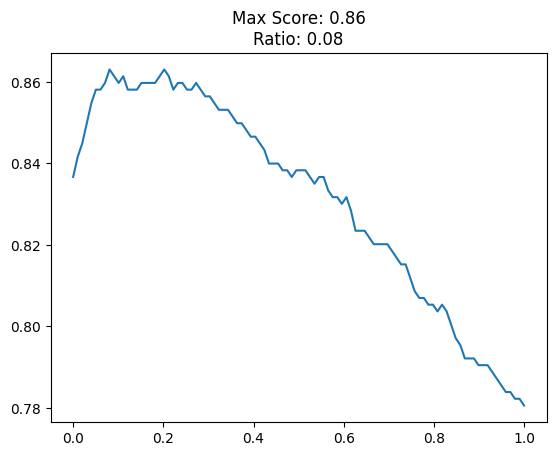

(np.float64(0.08080808080808081), np.float64(0.863036303630363))

In [ ]:
def optimize_ratio(model1, model2, df1, df2, task_name, lang, start=0, stop=1, steps=100):
    vectorized_map = np.vectorize(lambda x: bm25_model.pos_to_idx.get(x, None))

    _, sim_dense = model1.predict(df1["full_text"].values, scores=True, limit_k=False)
    _, sim_bm25 = model2.predict(df2["full_text"].values, scores=True, limit_k=False)

    # sim_bm25_norm = sim_bm25 / sim_bm25.sum(axis=1)[:, None]
    # sim_dense_norm = sim_dense / sim_dense.sum(axis=1)[:, None]

    sim_bm25_norm = (sim_bm25 - sim_bm25.min(axis=1, keepdims=True)) / (sim_bm25.max(axis=1, keepdims=True) - sim_bm25.min(axis=1, keepdims=True) + 1e-6)
    sim_dense_norm = (sim_dense - sim_dense.min(axis=1, keepdims=True)) / (sim_dense.max(axis=1, keepdims=True) - sim_dense.min(axis=1, keepdims=True) + 1e-6)

    df_combined_train = df1.copy()
    # df_combined_dev["preds"] = vectorized_map(idx_sim).tolist()

    plot_scores = []
    ratios = np.linspace(start, stop, num=steps)
    for i in tqdm(ratios):
        combined_sim = i * sim_bm25_norm + (1 - i) * sim_dense_norm
        idx_sim = np.argsort(-combined_sim, axis=1)
        vectorized_map = np.vectorize(lambda x: bm25_model.pos_to_idx.get(x, None))
        df_combined_train["preds"] = vectorized_map(idx_sim).tolist()
        d_out = bm25_model.evaluate(df_combined_train, task_name=task_name, lang=lang, ls_k=[1, 3, 5, 10])
        
        plot_scores.append(d_out[task_name][lang][10])

    max_id = np.argmax(plot_scores)
    max_score = plot_scores[max_id]
    max_ratio = ratios[max_id]

    import matplotlib.pyplot as plt
    plt.plot(ratios, plot_scores)
    plt.title(f"Max Score: {max_score:.2f}\nRatio: {max_ratio:.2f}")
    plt.show()
    
    return max_ratio, max_score

optimize_ratio(teacher_model, bm25_model, df_train_posts, df_train_posts_clean, task_name, lang)


100%|██████████| 100/100 [00:03<00:00, 28.38it/s]


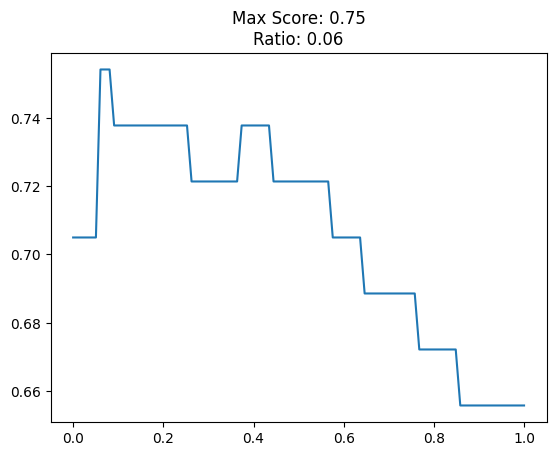

(np.float64(0.06060606060606061), np.float64(0.7540983606557377))

In [6]:
optimize_ratio(teacher_model, bm25_model, df_dev_posts, df_dev_posts_clean, task_name, lang)

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Optimizing ratio: 100%|██████████| 100/100 [00:02<00:00, 46.08it/s]


(np.float64(0.2828282828282829), np.float64(0.930622009569378))

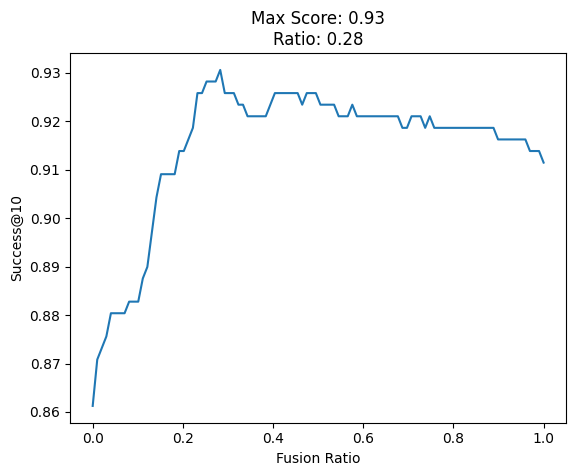

In [5]:
from src.models import FusionModel
fusion_model = FusionModel(model1=teacher_model, model2=bm25_model, k=10, output_folder="tmp")
fusion_model.fit(df_train_posts, df_train_posts_clean, task_name, lang)


In [9]:
df_fusion.preds.iloc[0]

[193333,
 193600,
 193578,
 193341,
 193382,
 193381,
 193561,
 193339,
 193466,
 193369]

In [7]:
df_fusion = df_dev_posts.copy()
df_fusion["preds"] = fusion_model.predict(df_dev_posts, df_dev_posts_clean, ratio=fusion_model.best_ratio).tolist()
fusion_model.evaluate(df_fusion, task_name=task_name, lang=lang)

Processing texts: 100%|██████████| 47/47 [00:00<00:00, 352.95it/s]


{'monolingual': {'tha': {1: np.float64(0.723404255319149),
   3: np.float64(0.851063829787234),
   5: np.float64(0.8723404255319149),
   10: np.float64(0.9574468085106383)}}}

# Reciprocal Ranking Fusion

In [7]:
idx_dense, sim_dense = teacher_model.predict(df_train_posts["full_text"].values, scores=True, limit_k=False)
idx_bm25, sim_bm25 = bm25_model.predict(df_train_posts["full_text"].values, scores=True, limit_k=False)

Processing texts: 100%|██████████| 418/418 [00:00<00:00, 619.48it/s]


In [ ]:
def rrf_score(rank, k):
    """Calculate Reciprocal Rank Fusion (RRF) score for a given rank and k."""
    return 1 / (rank + k)

k=60

sample_dense = idx_dense[0, :]

ls_scores_dense = []
ls_scores_bm25 = []
for i in range(len(sample_dense)):
    for j in 
    ls_scores_dense.append({int(x) : 1/(rank + k) for rank, x in enumerate()})

{193412: 0.016666666666666666,
 193305: 0.01639344262295082,
 193475: 0.016129032258064516,
 193569: 0.015873015873015872,
 193397: 0.015625,
 193405: 0.015384615384615385,
 193324: 0.015151515151515152,
 193469: 0.014925373134328358,
 193380: 0.014705882352941176,
 193567: 0.014492753623188406,
 193298: 0.014285714285714285,
 193279: 0.014084507042253521,
 193398: 0.013888888888888888,
 193306: 0.0136986301369863,
 193554: 0.013513513513513514,
 193588: 0.013333333333333334,
 193436: 0.013157894736842105,
 193360: 0.012987012987012988,
 193553: 0.01282051282051282,
 193377: 0.012658227848101266,
 193606: 0.0125,
 193244: 0.012345679012345678,
 118687: 0.012195121951219513,
 193581: 0.012048192771084338,
 193532: 0.011904761904761904,
 193248: 0.011764705882352941,
 193396: 0.011627906976744186,
 193443: 0.011494252873563218,
 193456: 0.011363636363636364,
 193372: 0.011235955056179775,
 193417: 0.011111111111111112,
 193608: 0.01098901098901099,
 193391: 0.010869565217391304,
 193486:

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

[193412 193305 193475 193569 193397 193405 193324 193469 193380 193567
 193298 193279 193398 193306 193554 193588 193436 193360 193553 193377
 193606 193244 118687 193581 193532 193248 193396 193443 193456 193372
 193417 193608 193391 193486 193481 193466 193587 193450 193402 193572
  99320 193550 193319 193291 193483 193328  33945 193495 193392 193264
 193578 193355 193406 193356 193463 193414 193499 193259 193389 193323
 193413 193408 193295 193566 193455 193545 193452 148640 193562 193395
 193457 193598 193404 193474 193302 193434 193526 193253 193341 193541
 193446 193576 193584  20642 193315 193419 193505 193335 193590 193370
 193292 193255 193390 193509 193371 193385 193605 193451  10587 193494
 193546 193604 193313 193299 193375 193285 193301 193447 193265 193471
 193551 193548 193246 193393 193376 193320   8144 193317 193249 193476
 193418 193352 193607 193533 193596 193276 193399 193273 193307 193326
 193472 193508 193480 193504 193343 193489 193251 193520 193599 193386
 19352

 25%|██▌       | 1/4 [00:00<00:01,  2.19it/s]

[193412 193305 193475 193569 193397 193405 193324 193469 193380 193567
 193298 193279 193398 193306 193554 193588 193436 193360 193553 193377
 193606 193244 118687 193581 193532 193248 193396 193443 193456 193372
 193417 193608 193391 193486 193481 193466 193587 193450 193402 193572
  99320 193550 193319 193291 193483 193328  33945 193495 193392 193264
 193578 193355 193406 193356 193463 193414 193499 193259 193389 193323
 193413 193408 193295 193566 193455 193545 193452 148640 193562 193395
 193457 193598 193404 193474 193302 193434 193526 193253 193341 193541
 193446 193576 193584  20642 193315 193419 193505 193335 193590 193370
 193292 193255 193390 193509 193371 193385 193605 193451  10587 193494
 193546 193604 193313 193299 193375 193285 193301 193447 193265 193471
 193551 193548 193246 193393 193376 193320   8144 193317 193249 193476
 193418 193352 193607 193533 193596 193276 193399 193273 193307 193326
 193472 193508 193480 193504 193343 193489 193251 193520 193599 193386
 19352

 50%|█████     | 2/4 [00:00<00:00,  2.22it/s]

[193412 193305 193475 193569 193397 193405 193324 193469 193380 193567
 193298 193279 193398 193306 193554 193588 193436 193360 193553 193377
 193606 193244 118687 193581 193532 193248 193396 193443 193456 193372
 193417 193608 193391 193486 193481 193466 193587 193450 193402 193572
  99320 193550 193319 193291 193483 193328  33945 193495 193392 193264
 193578 193355 193406 193356 193463 193414 193499 193259 193389 193323
 193413 193408 193295 193566 193455 193545 193452 148640 193562 193395
 193457 193598 193404 193474 193302 193434 193526 193253 193341 193541
 193446 193576 193584  20642 193315 193419 193505 193335 193590 193370
 193292 193255 193390 193509 193371 193385 193605 193451  10587 193494
 193546 193604 193313 193299 193375 193285 193301 193447 193265 193471
 193551 193548 193246 193393 193376 193320   8144 193317 193249 193476
 193418 193352 193607 193533 193596 193276 193399 193273 193307 193326
 193472 193508 193480 193504 193343 193489 193251 193520 193599 193386
 19352

 75%|███████▌  | 3/4 [00:01<00:00,  2.24it/s]

[193412 193305 193475 193569 193397 193405 193324 193469 193380 193567
 193298 193279 193398 193306 193554 193588 193436 193360 193553 193377
 193606 193244 118687 193581 193532 193248 193396 193443 193456 193372
 193417 193608 193391 193486 193481 193466 193587 193450 193402 193572
  99320 193550 193319 193291 193483 193328  33945 193495 193392 193264
 193578 193355 193406 193356 193463 193414 193499 193259 193389 193323
 193413 193408 193295 193566 193455 193545 193452 148640 193562 193395
 193457 193598 193404 193474 193302 193434 193526 193253 193341 193541
 193446 193576 193584  20642 193315 193419 193505 193335 193590 193370
 193292 193255 193390 193509 193371 193385 193605 193451  10587 193494
 193546 193604 193313 193299 193375 193285 193301 193447 193265 193471
 193551 193548 193246 193393 193376 193320   8144 193317 193249 193476
 193418 193352 193607 193533 193596 193276 193399 193273 193307 193326
 193472 193508 193480 193504 193343 193489 193251 193520 193599 193386
 19352

100%|██████████| 4/4 [00:01<00:00,  2.23it/s]


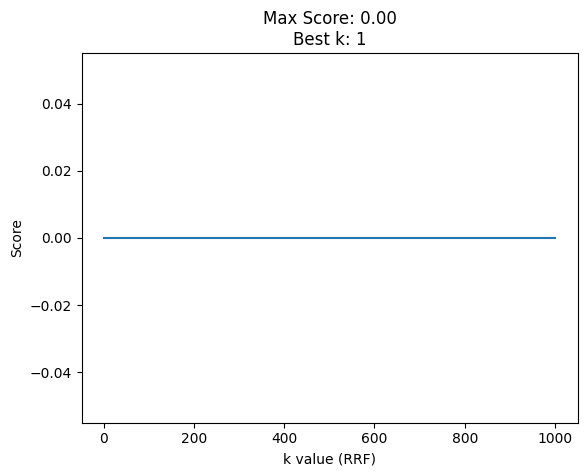

(1, np.float64(0.0))

In [6]:
def reciprocal_rank_fusion(model1, model2, df1, df2, task_name, lang, k_values=[60]):
    """
    Combine model predictions using Reciprocal Rank Fusion (RRF).

    Parameters:
    - model1, model2: Models used for prediction (e.g., dense, sparse retrieval).
    - df1, df2: DataFrames containing text to be predicted.
    - task_name: Name of the task for evaluation.
    - lang: Language for evaluation.
    - k_values: List of k values for RRF.

    Returns:
    - best_k: Best k value found.
    - max_score: Maximum score achieved.
    """
    from tqdm import tqdm
    import numpy as np
    import matplotlib.pyplot as plt

    def rrf_score(rank, k):
        """Calculate Reciprocal Rank Fusion (RRF) score for a given rank and k."""
        return 1 / (rank + k)

    idx_dense, sim_dense = model1.predict(df1["full_text"].values, scores=True, limit_k=False)
    idx_bm25, sim_bm25 = model2.predict(df2["full_text"].values, scores=True, limit_k=False)

    df_combined_train = df1.copy()
    plot_scores = []

    for k in tqdm(k_values):
        rrf_scores = []

        for dense_ranks, bm25_ranks in zip(idx_dense, idx_bm25):
            print(dense_ranks, bm25_ranks)
            # Compute RRF scores for both models
            dense_rrf = {doc_id: rrf_score(rank, k) for rank, doc_id in enumerate(dense_ranks)}
            bm25_rrf = {doc_id: rrf_score(rank, k) for rank, doc_id in enumerate(bm25_ranks)}

            # Combine RRF scores
            combined_rrf = {}
            for doc_id in set(dense_rrf.keys()).union(bm25_rrf.keys()):
                combined_rrf[doc_id] = dense_rrf.get(doc_id, 0) + bm25_rrf.get(doc_id, 0)

            # Sort by combined RRF scores (descending)
            sorted_docs = sorted(combined_rrf.keys(), key=lambda x: -combined_rrf[x])
            rrf_scores.append(sorted_docs)

        # Convert sorted predictions back to DataFrame format
        vectorized_map = np.vectorize(lambda x: model2.pos_to_idx.get(x, None))
        df_combined_train["preds"] = vectorized_map(rrf_scores).tolist()

        # Evaluate
        d_out = model2.evaluate(df_combined_train, task_name=task_name, lang=lang, ls_k=[1, 3, 5, 10])
        plot_scores.append(d_out[task_name][lang][10])

    # Find the best k
    max_id = np.argmax(plot_scores)
    max_score = plot_scores[max_id]
    best_k = k_values[max_id]

    # Plot scores
    plt.plot(k_values, plot_scores)
    plt.title(f"Max Score: {max_score:.2f}\nBest k: {best_k}")
    plt.xlabel("k value (RRF)")
    plt.ylabel("Score")
    plt.show()

    return best_k, max_score

# Example usage:
reciprocal_rank_fusion(teacher_model, bm25_model, df_train_posts, df_train_posts_clean, task_name, lang, k_values=[1, 10, 100, 1000])
